In [1]:
import numpy as np
from glob import glob
from astropy.io import fits, ascii
from astropy.wcs import WCS
from astropy.nddata.utils import Cutout2D
from astropy import units as u
from astropy.coordinates import SkyCoord
import astropy
from astropy.visualization.wcsaxes import WCSAxes
from astropy.wcs.utils import skycoord_to_pixel, pixel_to_skycoord
from matplotlib.patches import Ellipse, Circle
from matplotlib.patheffects import withStroke
from matplotlib.patches import Wedge
from matplotlib.collections import PatchCollection

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmasher as cms

from regions import EllipseSkyRegion, RectangleSkyRegion

from matplotlib import rc
rc('text', usetex=True)
font = {'family' : 'serif',
        'weight' : 'bold',
        'size'   : '14'}
rc('font', **font)

from math import log10, floor
def round_sig(x, sig=2):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [14]:
center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)
#bkg_cut_746 = Cutout2D(bkg_data_746,center, box_bkg, wcs=bkg_wcs_746)

img_list=[25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,76,77,78,79,84,85,86,87,141,142,143,144,145,146,147,148,149,150,151,152]

print(len(img_list))

54


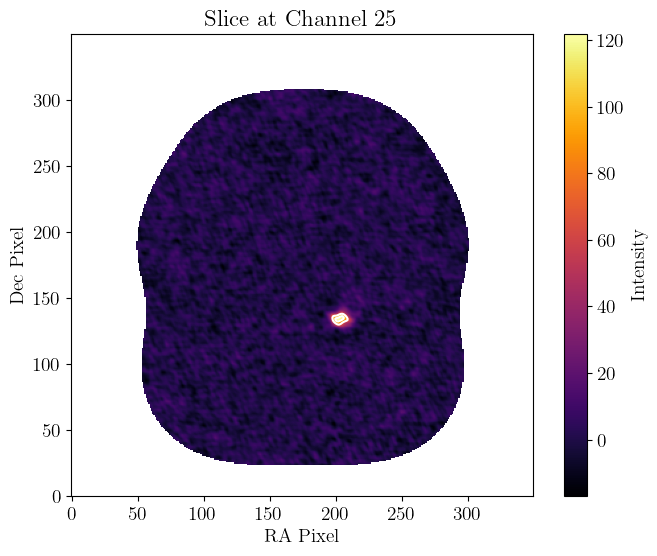

Number of NaN values in the cube: 12408296 25112500
Shape of the data: (205, 350, 350)


In [99]:
# Load the spectral cube
cube = fits.open('J1348_line3.fits')  # Replace 'filename.fits' with your file name
data = cube[0].data*1e3  # Access the data part of the FITS file

# Plot the 25th slice
plt.figure(figsize=(8, 6))  # Create a figure with specified dimensions
plt.imshow(data[43, :, :], origin='lower', cmap='inferno')  # Display the slice
plt.colorbar(label='Intensity')  # Add a colorbar to indicate intensity scale
plt.title('Slice at Channel 25')  # Title for the plot
plt.xlabel('RA Pixel')  # Label for the X-axis
plt.ylabel('Dec Pixel')  # Label for the Y-axis
plt.contour(data[43,:,:].data,data[43,:,:].data, colors='w',levels=36.809*np.array([2,3,4]))

plt.show()  # Display the plot


print("Number of NaN values in the cube:", np.isnan(data).sum(),(205*350*350))
print("Shape of the data:", data.shape)

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


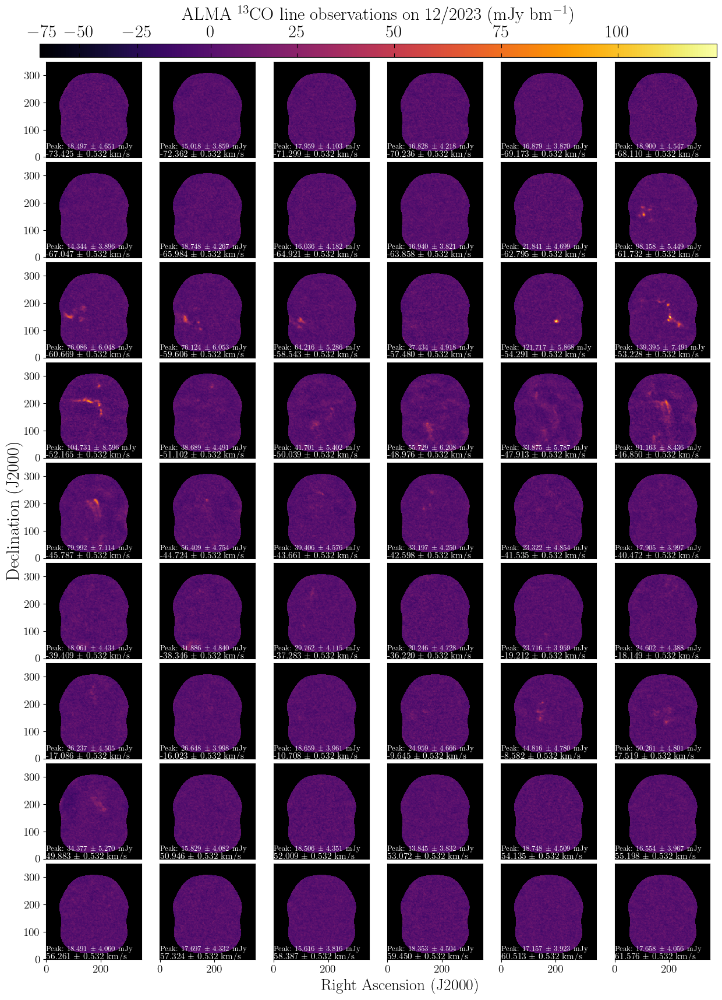

In [80]:


def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im  =  fits.open(bkg_fname)
    bkg_data = bkg_im[0].data*1e3
    bkg_data = bkg_data[fslice,:,:]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)
    #bkg_cut = Cutout2D(bkg_data,center, box_bkg, wcs=bkg_wcs)
        
    ax = plt.subplot2grid([nrows, ncols], [row, col], fig=fig)#, projection=bkg_data.wcs)
    
    #cmap = cms.torch
    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)
    #cmap_norm = colors.Normalize(vmin=-80, vmax=140.0)
    ax_bkimg = ax.imshow(bkg_data.data,
                         cmap = cmap,
                         norm = cmap_norm,
                         aspect = 'equal',
                         origin = 'lower', 
                         interpolation = 'none',
                         rasterized = True)#, transform=ax.get_transform(bkg_data.wcs))
        
    meerkat_beam = EllipseSkyRegion(center.spherical_offsets_by(-18*u.arcsec,-15*u.arcsec),
                                    bkg_im[0].header['BMIN']*u.deg,bkg_im[0].header['BMAJ']*u.deg,(bkg_im[0].header['BPA'])*u.deg)
    #meerkat_beam_pix_reg = meerkat_beam.to_pixel(bkg_cut.wcs)
    meerkat_beam.visual['color'] = 'w'
    meerkat_beam.visual['facecolor'] = '0.5'
    meerkat_beam.visual['fill'] = True
    meerkat_beam.visual['linewidth'] = 1.0
    #meerkat_beam.plot(ax=ax)
    if row == 4 and col == 0:
        ax.set_ylabel(r"Declination (J2000)", size=22,labelpad=0.4)
    else:
        ax.set_ylabel(r" ", size=22)

    if row == 8 and col == 2:
        ax.set_xlabel(r"Right Ascension (J2000)", size=20,ha='left')
    else:
        ax.set_xlabel(r" ", size=20)
    #axra = ax[0]
    #axdec = ax[1]
    if row != 8:
        ax.set_xticks([])
    if col != 0:
        ax.set_yticks([])
    array_max = np.nanmax(bkg_data)  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(bkg_data**2))  # Calculate the RMS, ignoring NaNs

    # Format the text to display maximum value and RMS
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"


    value = vini + np.float64(fslice) * res
    formatted_value = f"{value:.3f} ± 0.532 km/s"
    
    ax.text(0, 29, max_rms_text, fontsize=label_fsize - 17, color='w')  # New text
    ax.text(0, 0, formatted_value, fontsize=label_fsize - 15, color='w')
    
    return fig, ax_bkimg
    


fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,76,77,78,79,84,85,86,87,141,142,143,144,145,146,147,148,149,150,151,152]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,9,6,int(meer_n/6),meer_n%6,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

fig.subplots_adjust(hspace=0.05,wspace=0.05)

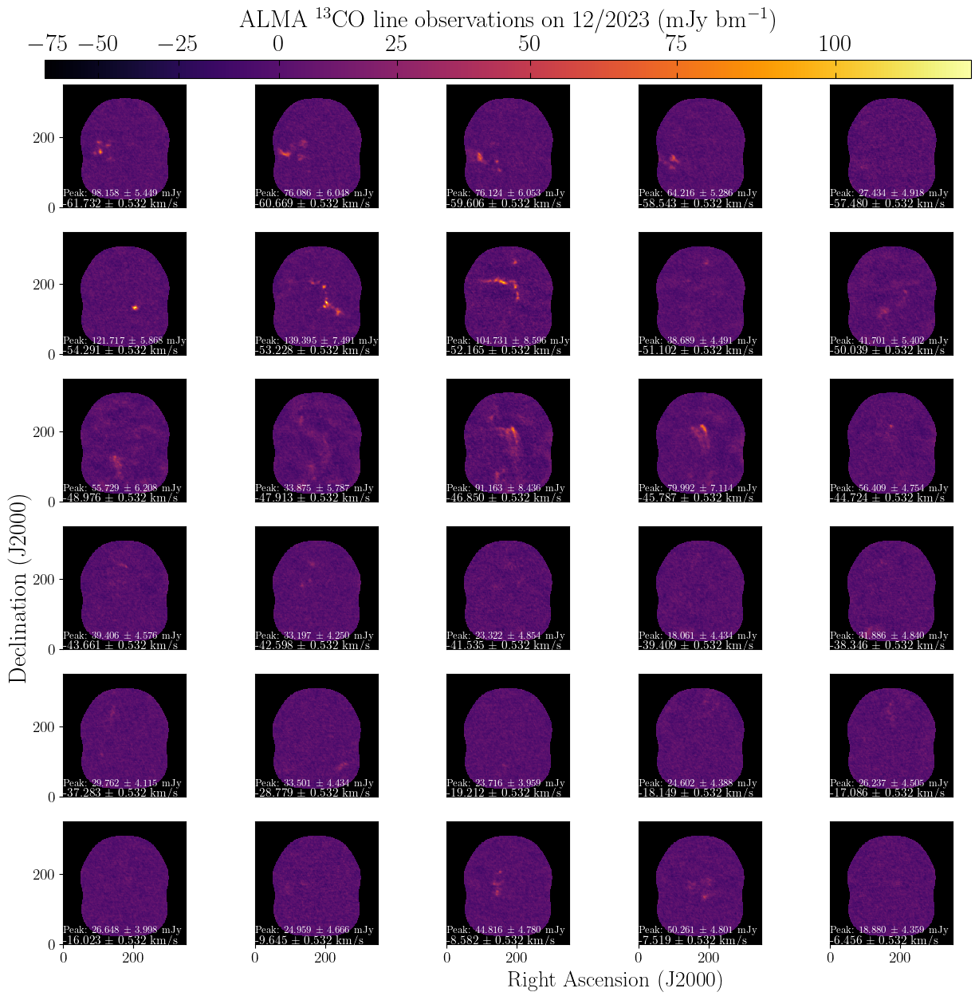

In [124]:

def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im  =  fits.open(bkg_fname)
    bkg_data = bkg_im[0].data*1e3
    bkg_data = bkg_data[fslice,:,:]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)
    #bkg_cut = Cutout2D(bkg_data,center, box_bkg, wcs=bkg_wcs)
        
    ax = plt.subplot2grid([nrows, ncols], [row, col], fig=fig)#, projection=bkg_data.wcs)
    
    #cmap = cms.torch
    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)
    #cmap_norm = colors.Normalize(vmin=-80, vmax=140.0)
    ax_bkimg = ax.imshow(bkg_data.data,
                         cmap = cmap,
                         norm = cmap_norm,
                         aspect = 'equal',
                         origin = 'lower', 
                         interpolation = 'none',
                         rasterized = True)#, transform=ax.get_transform(bkg_data.wcs))
        
    meerkat_beam = EllipseSkyRegion(center.spherical_offsets_by(-18*u.arcsec,-15*u.arcsec),
                                    bkg_im[0].header['BMIN']*u.deg,bkg_im[0].header['BMAJ']*u.deg,(bkg_im[0].header['BPA'])*u.deg)
    #meerkat_beam_pix_reg = meerkat_beam.to_pixel(bkg_cut.wcs)
    meerkat_beam.visual['color'] = 'w'
    meerkat_beam.visual['facecolor'] = '0.5'
    meerkat_beam.visual['fill'] = True
    meerkat_beam.visual['linewidth'] = 1.0
    #meerkat_beam.plot(ax=ax)
    if row == 3 and col == 0:
        ax.set_ylabel(r"Declination (J2000)", size=22,labelpad=0.4)
    else:
        ax.set_ylabel(r" ", size=22)

    if row == 5 and col == 2:
        ax.set_xlabel(r"Right Ascension (J2000)", size=20,ha='left')
    else:
        ax.set_xlabel(r" ", size=20)
    #axra = ax[0]
    #axdec = ax[1]
    if row != 5:
        ax.set_xticks([])
    if col != 0:
        ax.set_yticks([])
        
    array_max = np.nanmax(bkg_data)  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(bkg_data**2))  # Calculate the RMS, ignoring NaNs
    

    # Format the text to display maximum value and RMS
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"


    value = vini + np.float64(fslice) * res
    formatted_value = f"{value:.3f} ± 0.532 km/s"
    
    ax.text(0, 29, max_rms_text, fontsize=label_fsize - 17, color='w')  # New text
    ax.text(0, 0, formatted_value, fontsize=label_fsize - 15, color='w')
    
    #plt.scatter((174), (174), zorder=10, marker='x',color='r', s=80)
    
    return fig, ax_bkimg
    


fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[36,37,38,39,40,43,44,45,46,47,48,49,50,51,52,53,54,55,57,58,59,67,76,77,78,79,85,86,87,88]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,6,5,int(meer_n/5),meer_n%5,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

#fig.subplots_adjust(hspace=0.005,wspace=0.005)

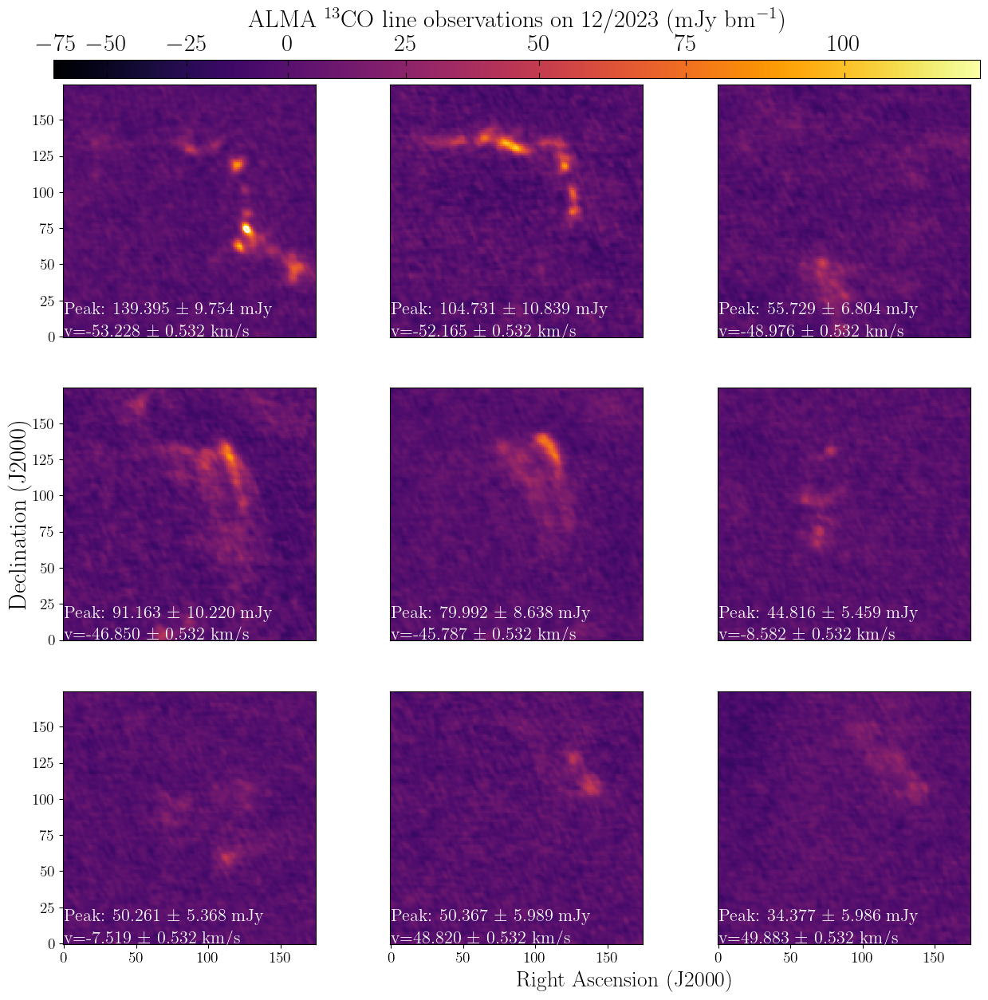

In [113]:
def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im  =  fits.open(bkg_fname)
    bkg_data = bkg_im[0].data*1e3
    bkg_data = bkg_data[fslice,75:250,75:250]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)
    #bkg_cut = Cutout2D(bkg_data,center, box_bkg, wcs=bkg_wcs)
        
    ax = plt.subplot2grid([nrows, ncols], [row, col], fig=fig)#, projection=bkg_data.wcs)
    
    #cmap = cms.torch
    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)
    #cmap_norm = colors.Normalize(vmin=-80, vmax=140.0)
    ax_bkimg = ax.imshow(bkg_data.data,
                         cmap = cmap,
                         norm = cmap_norm,
                         aspect = 'equal',
                         origin = 'lower', 
                         interpolation = 'none',
                         rasterized = True)#, transform=ax.get_transform(bkg_data.wcs))
        
    meerkat_beam = EllipseSkyRegion(center.spherical_offsets_by(-18*u.arcsec,-15*u.arcsec),
                                    bkg_im[0].header['BMIN']*u.deg,bkg_im[0].header['BMAJ']*u.deg,(bkg_im[0].header['BPA'])*u.deg)
    #meerkat_beam_pix_reg = meerkat_beam.to_pixel(bkg_cut.wcs)
    meerkat_beam.visual['color'] = 'w'
    meerkat_beam.visual['facecolor'] = '0.5'
    meerkat_beam.visual['fill'] = True
    meerkat_beam.visual['linewidth'] = 1.0
    #meerkat_beam.plot(ax=ax)
    if row == 1 and col == 0:
        ax.set_ylabel(r"Declination (J2000)", size=22,labelpad=0.4)
    else:
        ax.set_ylabel(r" ", size=22)

    if row == 2 and col == 1:
        ax.set_xlabel(r"Right Ascension (J2000)", size=20,ha='left')
    else:
        ax.set_xlabel(r" ", size=20)
    #axra = ax[0]
    #axdec = ax[1]
    if row != 2:
        ax.set_xticks([])
    if col != 0:
        ax.set_yticks([])
        
    array_max = np.nanmax(bkg_data)  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(bkg_data**2))  # Calculate the RMS, ignoring NaNs

    # Format the text to display maximum value and RMS
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"


    value = vini + np.float64(fslice) * res
    formatted_value = f"v={value:.3f} ± 0.532 km/s"
    
    ax.text(0, 15, max_rms_text, fontsize=label_fsize - 10, color='w')  # New text
    ax.text(0, 0, formatted_value, fontsize=label_fsize - 10, color='w')
    
    plt.contour(bkg_data.data,bkg_data.data, colors='w',levels=40*np.array([3,4,5]))
    
    return fig, ax_bkimg
    


fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[44,45,48,50,51,86,87,140,141]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,3,3,int(meer_n/3),meer_n%3,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

#fig.subplots_adjust(hspace=0.005,wspace=0.005)

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


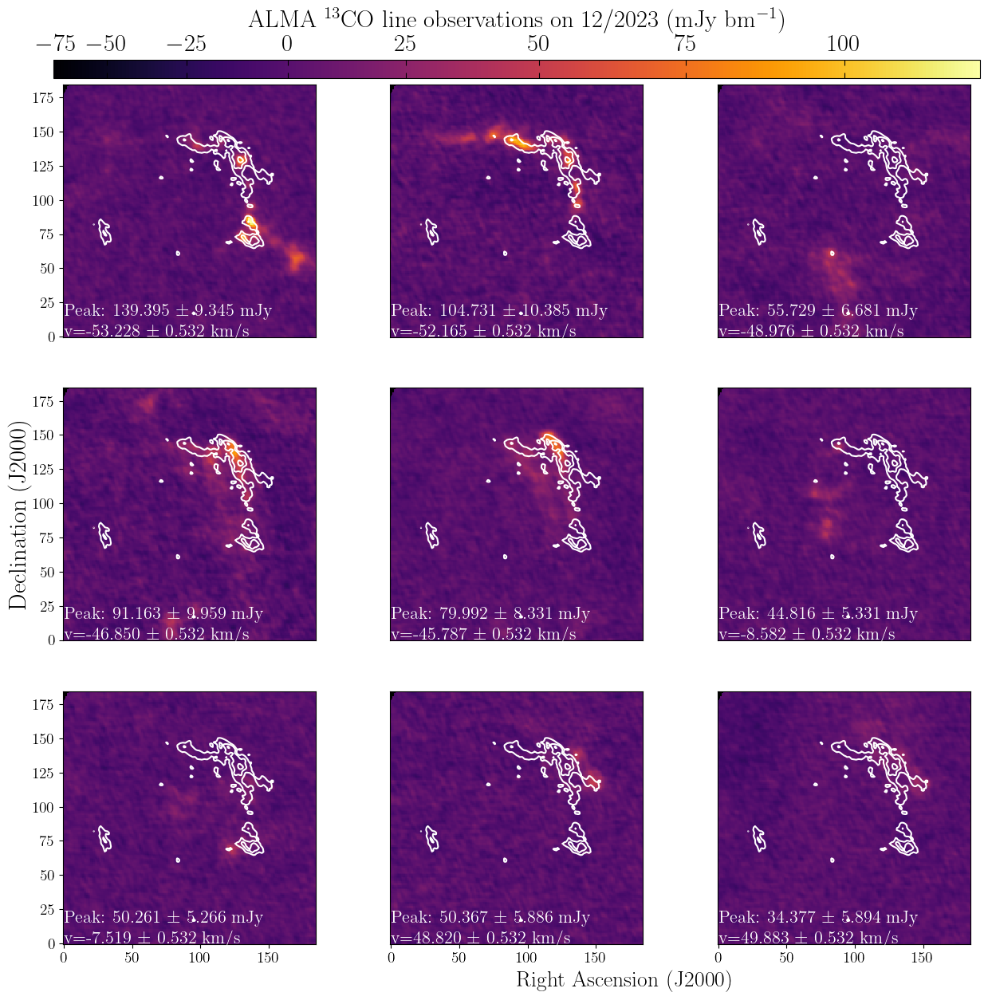

In [120]:
def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im  =  fits.open(bkg_fname)
    bkg_data = bkg_im[0].data*1e3
    bkg_data = bkg_data[fslice,65:250,65:250]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    contour_data = contour_data[65:250, 65:250]
    #bkg_cut = Cutout2D(bkg_data,center, box_bkg, wcs=bkg_wcs)
        
    ax = plt.subplot2grid([nrows, ncols], [row, col], fig=fig)#, projection=bkg_data.wcs)
    
    #cmap = cms.torch
    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)
    #cmap_norm = colors.Normalize(vmin=-80, vmax=140.0)
    ax_bkimg = ax.imshow(bkg_data.data,
                         cmap = cmap,
                         norm = cmap_norm,
                         aspect = 'equal',
                         origin = 'lower', 
                         interpolation = 'none',
                         rasterized = True)#, transform=ax.get_transform(bkg_data.wcs))
        
    meerkat_beam = EllipseSkyRegion(center.spherical_offsets_by(-18*u.arcsec,-15*u.arcsec),
                                    bkg_im[0].header['BMIN']*u.deg,bkg_im[0].header['BMAJ']*u.deg,(bkg_im[0].header['BPA'])*u.deg)
    #meerkat_beam_pix_reg = meerkat_beam.to_pixel(bkg_cut.wcs)
    meerkat_beam.visual['color'] = 'w'
    meerkat_beam.visual['facecolor'] = '0.5'
    meerkat_beam.visual['fill'] = True
    meerkat_beam.visual['linewidth'] = 1.0
    #meerkat_beam.plot(ax=ax)
    if row == 1 and col == 0:
        ax.set_ylabel(r"Declination (J2000)", size=22,labelpad=0.4)
    else:
        ax.set_ylabel(r" ", size=22)

    if row == 2 and col == 1:
        ax.set_xlabel(r"Right Ascension (J2000)", size=20,ha='left')
    else:
        ax.set_xlabel(r" ", size=20)
    #axra = ax[0]
    #axdec = ax[1]
    if row != 2:
        ax.set_xticks([])
    if col != 0:
        ax.set_yticks([])
        
    array_max = np.nanmax(bkg_data)  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(bkg_data**2))  # Calculate the RMS, ignoring NaNs

    # Format the text to display maximum value and RMS
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"


    value = vini + np.float64(fslice) * res
    formatted_value = f"v={value:.3f} ± 0.532 km/s"
    
    ax.text(0, 15, max_rms_text, fontsize=label_fsize - 10, color='w')  # New text
    ax.text(0, 0, formatted_value, fontsize=label_fsize - 10, color='w')
    
    plt.contour(contour_data.data,contour_data.data, colors='w',levels=40*np.array([3,5,7]))
    
    return fig, ax_bkimg
    


fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[44,45,48,50,51,86,87,140,141]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,3,3,int(meer_n/3),meer_n%3,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

#fig.subplots_adjust(hspace=0.005,wspace=0.005)

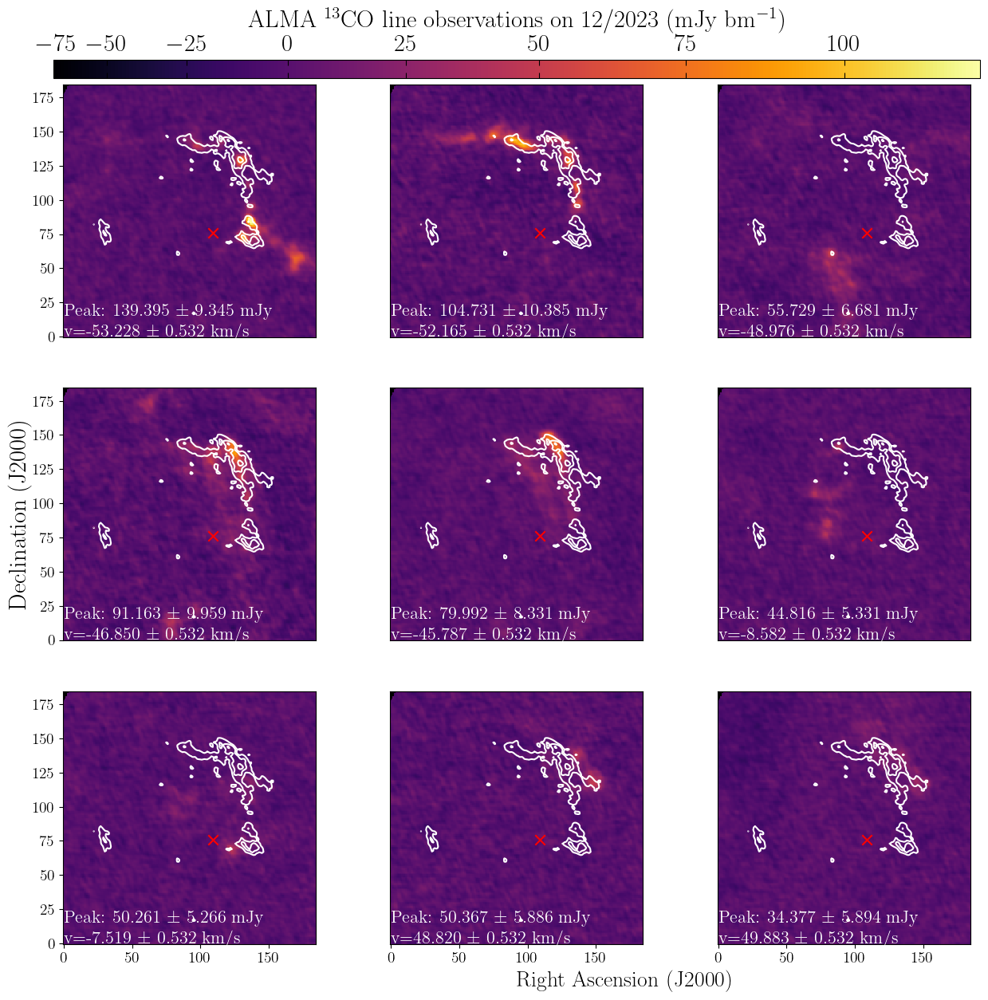

In [122]:
def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im  =  fits.open(bkg_fname)
    bkg_data = bkg_im[0].data*1e3
    bkg_data = bkg_data[fslice,65:250,65:250]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    contour_data = contour_data[65:250, 65:250]
    #bkg_cut = Cutout2D(bkg_data,center, box_bkg, wcs=bkg_wcs)
        
    ax = plt.subplot2grid([nrows, ncols], [row, col], fig=fig)#, projection=bkg_data.wcs)
    
    #cmap = cms.torch
    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)
    #cmap_norm = colors.Normalize(vmin=-80, vmax=140.0)
    ax_bkimg = ax.imshow(bkg_data.data,
                         cmap = cmap,
                         norm = cmap_norm,
                         aspect = 'equal',
                         origin = 'lower', 
                         interpolation = 'none',
                         rasterized = True)#, transform=ax.get_transform(bkg_data.wcs))
        
    meerkat_beam = EllipseSkyRegion(center.spherical_offsets_by(-18*u.arcsec,-15*u.arcsec),
                                    bkg_im[0].header['BMIN']*u.deg,bkg_im[0].header['BMAJ']*u.deg,(bkg_im[0].header['BPA'])*u.deg)
    #meerkat_beam_pix_reg = meerkat_beam.to_pixel(bkg_cut.wcs)
    meerkat_beam.visual['color'] = 'w'
    meerkat_beam.visual['facecolor'] = '0.5'
    meerkat_beam.visual['fill'] = True
    meerkat_beam.visual['linewidth'] = 1.0
    #meerkat_beam.plot(ax=ax)
    if row == 1 and col == 0:
        ax.set_ylabel(r"Declination (J2000)", size=22,labelpad=0.4)
    else:
        ax.set_ylabel(r" ", size=22)

    if row == 2 and col == 1:
        ax.set_xlabel(r"Right Ascension (J2000)", size=20,ha='left')
    else:
        ax.set_xlabel(r" ", size=20)
    #axra = ax[0]
    #axdec = ax[1]
    if row != 2:
        ax.set_xticks([])
    if col != 0:
        ax.set_yticks([])
        
    array_max = np.nanmax(bkg_data)  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(bkg_data**2))  # Calculate the RMS, ignoring NaNs

    # Format the text to display maximum value and RMS
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"


    value = vini + np.float64(fslice) * res
    formatted_value = f"v={value:.3f} ± 0.532 km/s"
    
    ax.text(0, 15, max_rms_text, fontsize=label_fsize - 10, color='w')  # New text
    ax.text(0, 0, formatted_value, fontsize=label_fsize - 10, color='w')
    
    plt.contour(contour_data.data,contour_data.data, colors='w',levels=40*np.array([3,5,7]))
    
    plt.scatter((174-65), (250-174), zorder=10, marker='x',color='r', s=80)
    return fig, ax_bkimg
    


fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[44,45,48,50,51,86,87,140,141]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,3,3,int(meer_n/3),meer_n%3,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

#fig.subplots_adjust(hspace=0.005,wspace=0.005)

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


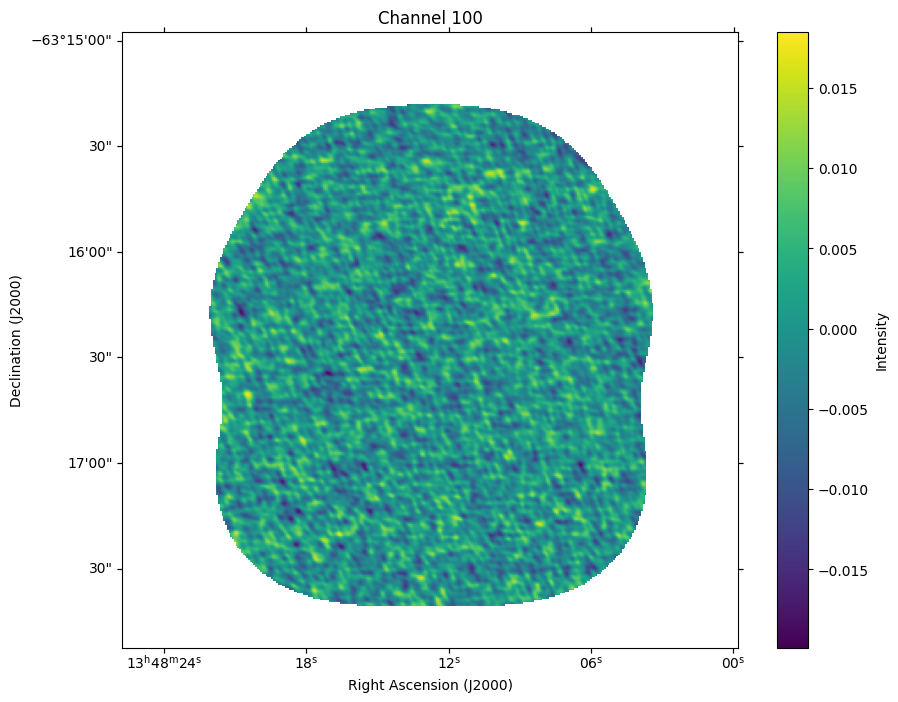

In [1]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data

# Load WCS info
wcs = WCS(header)

# Select the channel you want (e.g., channel 100 along axis of size 205)
channel_index = 100  # Modify as needed
image = data[25, :, :]  # Assuming channel is the first axis

# Plot the channel with RA/Dec axes
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)
im = ax.imshow(image, origin="lower", cmap="viridis")
plt.colorbar(im, label="Intensity")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Channel {channel_index}")
plt.show()


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 fro

Figure saved as Tiles_mom0cont_scatter.pdf


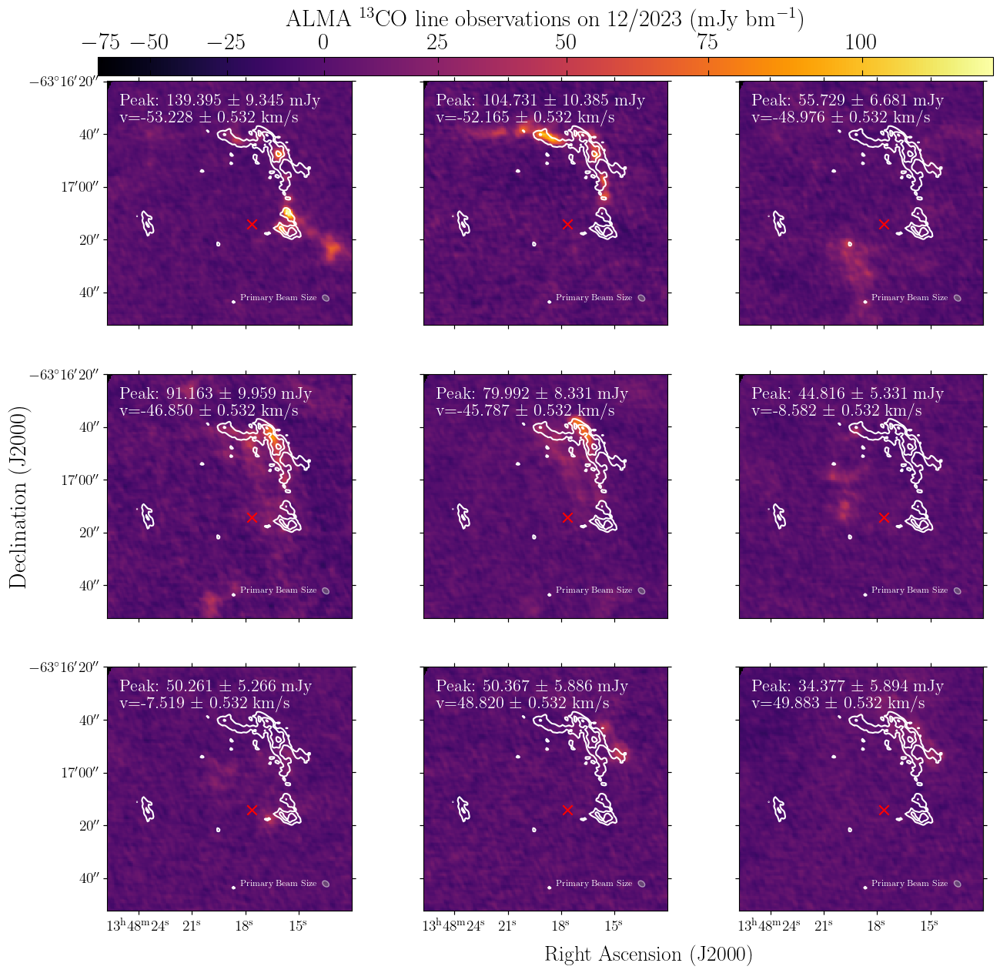

In [30]:


def add_panel(fig, nrows, ncols, row, col, bkg_fname, fslice, vini, res):
    bkg_im = fits.open(bkg_fname)
    bkg_data = bkg_im[0].data * 1e3
    bkg_data = bkg_data[fslice, 65:250, 65:250]
    bkg_wcs = WCS(bkg_im[0].header, naxis=2)

    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    contour_data = contour_data[65:250, 65:250]

    # Create subplot with WCS projection for RA/Dec
    ax = fig.add_subplot(
        nrows, ncols, row * ncols + col + 1, projection=bkg_wcs
    )

    cmap = plt.get_cmap('inferno')
    cmap.set_bad('black')
    cmap_norm = colors.PowerNorm(1.5, vmin=-80, vmax=120.0)

    ax_bkimg = ax.imshow(
        bkg_data,
        cmap=cmap,
        norm=cmap_norm,
        aspect='equal',
        origin='lower',
        interpolation='none',
    )

    if row == 1 and col == 0:
        ax.set_ylabel("Declination (J2000)", size=22, labelpad=0.4)
    else:
        ax.set_ylabel(" ")

    if row == 2 and col == 1:
        ax.set_xlabel("Right Ascension (J2000)", size=20, ha='left')
    else:
        ax.set_xlabel(" ")

    if row != 2:
        ax.coords[0].set_ticklabel_visible(False)
    if col != 0:
        ax.coords[1].set_ticklabel_visible(False)

    # Convert the beam's center to pixel coordinates
    beam_center_pixel = skycoord_to_pixel(center.spherical_offsets_by(-18 * u.arcsec, -15 * u.arcsec), bkg_wcs)

    # Convert beam dimensions from degrees to pixels
    beam_bmin_pix = bkg_im[0].header['BMIN'] / abs(bkg_wcs.wcs.cdelt[1])
    beam_bmaj_pix = bkg_im[0].header['BMAJ'] / abs(bkg_wcs.wcs.cdelt[0])
    beam_bpa_deg = bkg_im[0].header['BPA']
    
    x_pos = bkg_data.shape[1] - 20  # Slight offset from the right edge
    y_pos = 20  # Slight offset from the bottom edge

    # Create an ellipse to represent the beam
    beam_ellipse = Ellipse(
        xy=(x_pos,y_pos),  # (x, y) in pixel coordinates
        width=beam_bmin_pix,   # Minor axis in pixels
        height=beam_bmaj_pix,  # Major axis in pixels
        angle=beam_bpa_deg,    # Position angle in degrees
        edgecolor='white',
        facecolor='gray',
        alpha=0.5,
        linewidth=1.0,
        zorder=10)

    
    # Add the beam ellipse to the axes
    ax.add_patch(beam_ellipse)
    ax.text(x_pos-65, y_pos,  # Position slightly offset from the ellipse
    'Primary Beam Size',
    color='white',
    fontsize=label_fsize-18,
    ha='left',
    va='center',
    zorder=11)  # Ensure the text appears above the ellipse)
    
    # Annotate the panel with peak and velocity info
    array_max = np.nanmax(bkg_data)
    rms = np.sqrt(np.nanmean(bkg_data**2))
    max_rms_text = f"Peak: {array_max:.3f} ± {rms:.3f} mJy"
    value = vini + np.float64(fslice) * res
    formatted_value = f"v={value:.3f} ± 0.532 km/s"

    ax.text(0.05, 0.90, max_rms_text, fontsize=label_fsize-10, color='w', transform=ax.transAxes)
    ax.text(0.05, 0.83, formatted_value, fontsize=label_fsize-10, color='w', transform=ax.transAxes)

    plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))
    plt.scatter((174 - 65), (250 - 174), zorder=10, marker='x', color='r', s=80)

    return fig, ax_bkimg
fig = plt.figure(figsize=(15,20))
label_fsize = 26

center = SkyCoord('13h48m12.739s', '-63d16m24.7s', frame='icrs')
box_bkg = [120*u.arcsecond,120*u.arcsecond]
box_contour1 = [120*u.arcsecond,120*u.arcsecond]

bkg_im_746  =  fits.open('J1348_line3.fits')
bkg_data_746 = bkg_im_746[0].data[0][0]*1e3
bkg_wcs_746 = WCS(bkg_im_746[0].header, naxis=2)

vini=-100.00

res=1.063

img_list=[44,45,48,50,51,86,87,140,141]

for meer_n, meer_img in enumerate(img_list):
    _, ax_bkimg = add_panel(fig,3,3,int(meer_n/3),meer_n%3,'J1348_line3.fits', meer_img,vini,res);

cbar = fig.colorbar(ax_bkimg, ax=fig.axes, orientation='horizontal', anchor=(0,7.45),aspect=50)
cbar.ax.set_title('ALMA $^{13}$CO line observations on 12/2023 (mJy bm$^{-1}$)',fontsize=label_fsize-4,ha='center')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.tick_params(direction='in',length=5,bottom=True,top=True)
cbar.ax.xaxis.set_tick_params(labelsize=label_fsize-4)

# Save the figure in a LaTeX-editable format
output_filename = "Tiles_mom0cont_scatter.pdf"  # Change to .pdf if you prefer PDF
fig.savefig(
    output_filename,
    dpi=300,                   # High resolution
    format="pdf",              # Use "pdf" if you prefer PDF
    bbox_inches="tight",       # Trim whitespace
    pad_inches=0.1,            # Padding around the figure
    metadata={'Creator': 'Matplotlib'}  # Metadata for the file
)

print(f"Figure saved as {output_filename}")

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


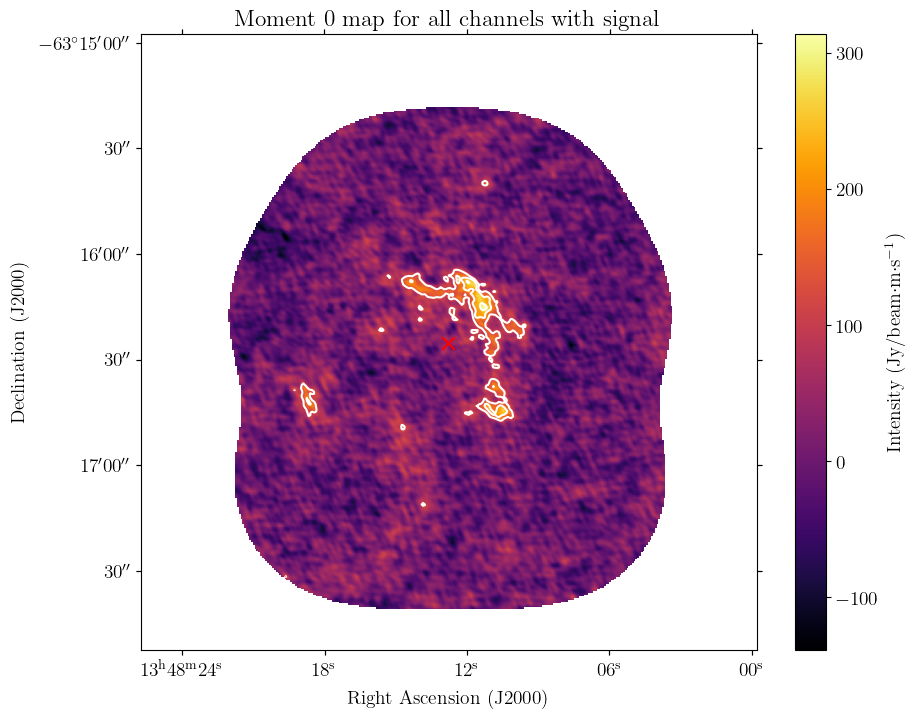

Figure saved as mom_0map_contours_scatter_ra_dec.pdf


In [29]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

# Load the FITS file
file_path = "moment_0_selected_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Select the channel you want (e.g., channel 100 along axis of size 205)
channel_index = 100  # Modify as needed
image = data[:, :]  # Assuming channel is the first axis

# Plot the channel with RA/Dec axes
fig=plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)
im = ax.imshow(image, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all channels with signal")

plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))
plt.scatter((174), (174), zorder=10, marker='x', color='r', s=80)
    
plt.show()

# Save the figure in a LaTeX-editable format
output_filename = "mom_0map_contours_scatter_ra_dec.pdf"  # Change to .pdf if you prefer PDF
fig.savefig(
    output_filename,
    dpi=300,                   # High resolution
    format="pdf",              # Use "pdf" if you prefer PDF
    bbox_inches="tight",       # Trim whitespace
    pad_inches=0.1,            # Padding around the figure
    metadata={'Creator': 'Matplotlib'}  # Metadata for the file
)

print(f"Figure saved as {output_filename}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


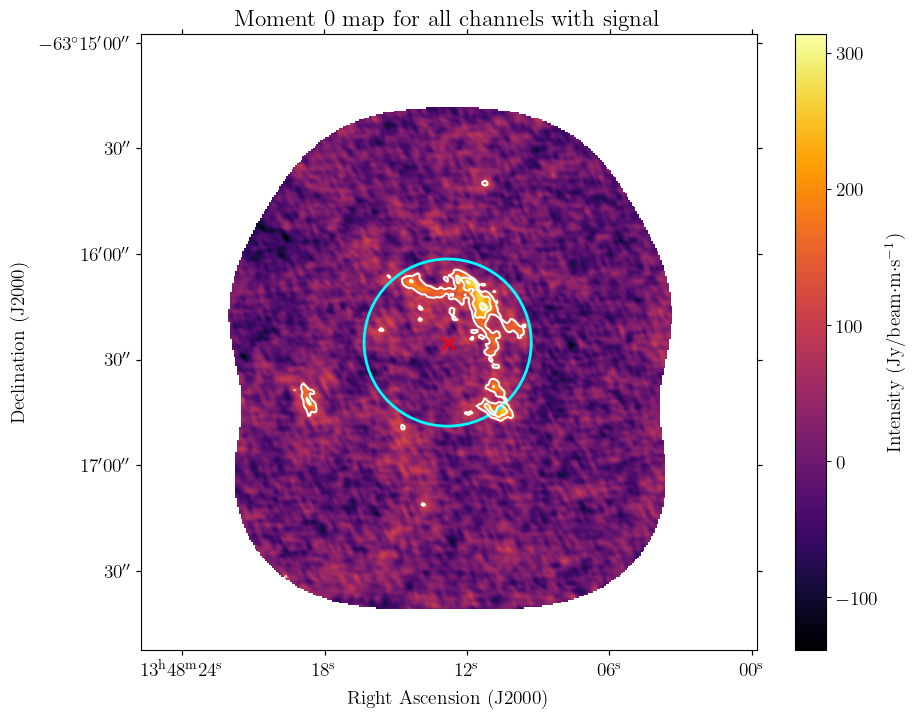

Figure saved as mom_0map_contours_scatter_circle_ra_dec.pdf


In [33]:
# Load the FITS file
file_path = "moment_0_selected_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Select the channel you want (e.g., channel 100 along axis of size 205)
channel_index = 100  # Modify as needed
image = data[:, :]  # Assuming channel is the first axis

# Calculate pixel scale in arcseconds/pixel
pixel_scale = np.abs(header['CDELT1']) * 3600  # Assuming square pixels
radius_pixels = 23.74 / pixel_scale  # Convert radius to pixels

# Plot the channel with RA/Dec axes
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)
im = ax.imshow(image, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all channels with signal")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add scatter point
center_pixel = (174, 174)  # Modify if needed
plt.scatter(*center_pixel, zorder=10, marker='x', color='r', s=80)

# Add circle
circle = Circle(
    center_pixel, 
    radius=radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    lw=2
)
ax.add_patch(circle)

plt.show()

# Save the figure in a LaTeX-editable format
output_filename = "mom_0map_contours_scatter_circle_ra_dec.pdf"  # Change to .pdf if you prefer PDF
fig.savefig(
    output_filename,
    dpi=300,                   # High resolution
    format="pdf",              # Use "pdf" if you prefer PDF
    bbox_inches="tight",       # Trim whitespace
    pad_inches=0.1,            # Padding around the figure
    metadata={'Creator': 'Matplotlib'}  # Metadata for the file
)

print(f"Figure saved as {output_filename}")


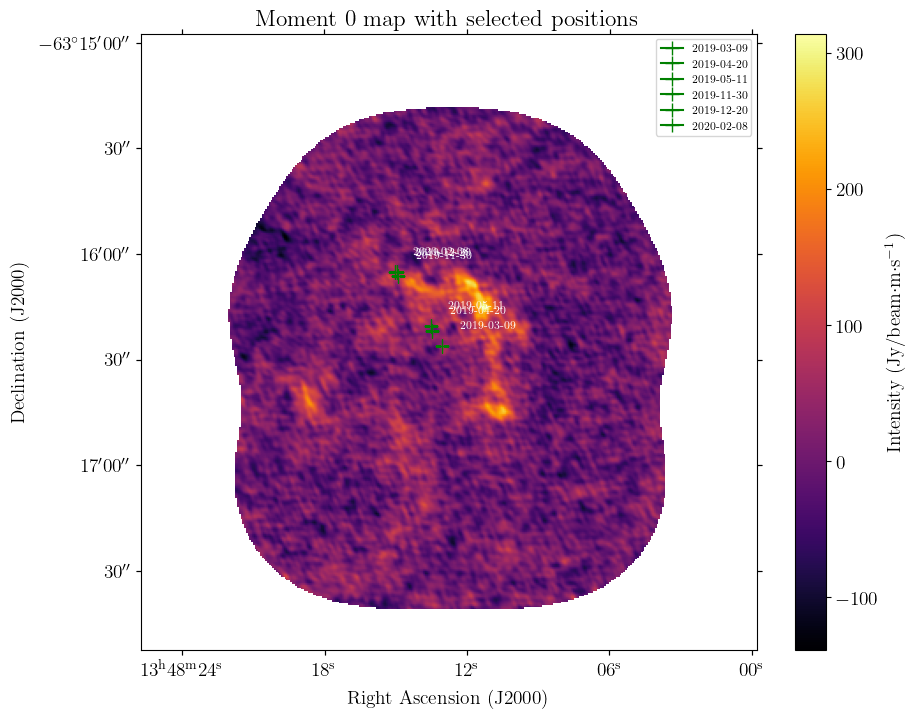

Figure saved as mom_0map_with_green_crosses.pdf


In [35]:

# Define RA and Dec values for the specified dates
ra_dec = {
    "2019-03-09": ("13h48m13.03s", "-63d16m26.26s"),
    "2019-04-20": ("13h48m13.45s", "-63d16m21.91s"),
    "2019-05-11": ("13h48m13.53s", "-63d16m20.47s"),
    "2019-11-30": ("13h48m14.90s", "-63d16m06.27s"),
    "2019-12-20": ("13h48m14.93s", "-63d16m05.28s"),
    "2020-02-08": ("13h48m15.03s", "-63d16m05.23s"),
}

# Transform coordinates from RA/Dec to pixel coordinates
coords = []
for date, (ra, dec) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree))

# Plot the green crosses (+ signs) on the existing plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Re-draw the main image
im = ax.imshow(image, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map with selected positions")

# Add green "+" signs and labels
for date, ra_deg, dec_deg in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.plot(
        pixel_coord[0], pixel_coord[1], marker="+", color="green", markersize=10, label=date
    )
    ax.text(
        pixel_coord[0] + 10, pixel_coord[1] + 10, date, color="white", fontsize=8, zorder=10
    )

plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "mom_0map_with_green_crosses.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)

print(f"Figure saved as {output_filename}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


[('MAXI J1348-630', 207.05307916666666, -63.27352777777778)]


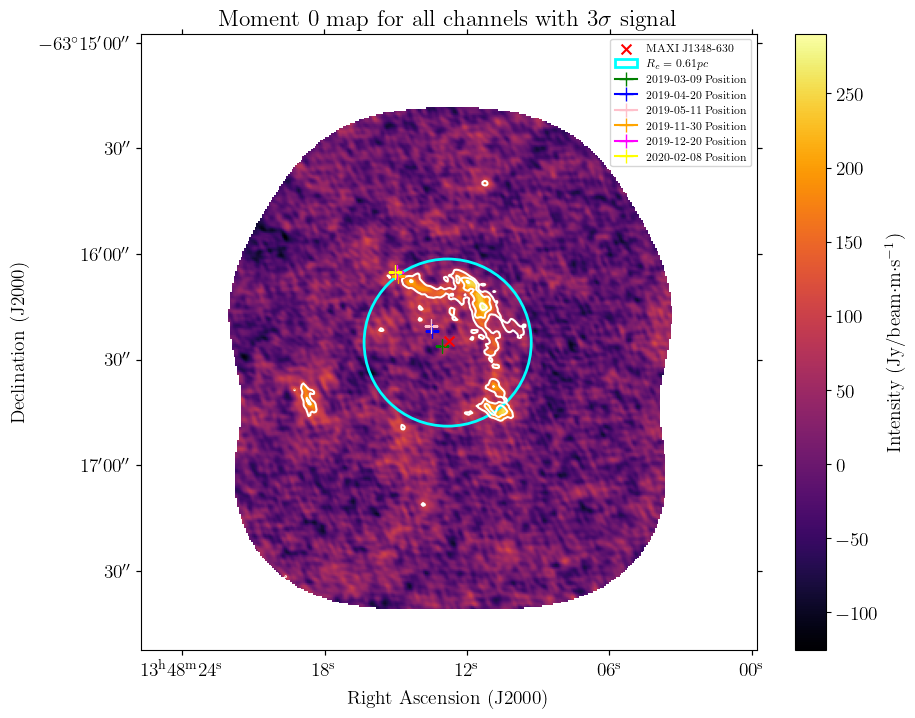

Figure saved as mom_0map_full_features.pdf


In [51]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np

# Load the FITS file
file_path = "moment_0_receeding_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Define pixel scale and radius for the circle
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert from degrees to arcseconds
radius_pixels = 23.74 / pixel_scale  # Circle radius in pixels

# Define RA/Dec values for the green "+" signs (in degrees)
ra_dec = {
    "2019-03-09": ("13h48m13.03s", "-63d16m26.26s", 'green'),
    "2019-04-20": ("13h48m13.45s", "-63d16m21.91s", 'blue'),
    "2019-05-11": ("13h48m13.53s", "-63d16m20.47s", 'pink'),
    "2019-11-30": ("13h48m14.90s", "-63d16m06.27s", 'orange'),
    "2019-12-20": ("13h48m14.93s", "-63d16m05.28s", 'magenta'),
    "2020-02-08": ("13h48m15.03s", "-63d16m05.23s", 'yellow'),
}

ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.739s', '-63d16m24.7s')}
# Transform coordinates from RA/Dec to pixel coordinates
coords = []
coordsJ1348=[]
for date, (ra, dec, color) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree, color))
    
for name, (ra,dec) in ra_dec_J1348.items():
    sky_coord_J1348 = SkyCoord(ra, dec, frame="icrs")
    coordsJ1348.append((name, sky_coord_J1348.ra.degree, sky_coord_J1348.dec.degree))
    
print(coordsJ1348)
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Main image
im = ax.imshow(data, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all channels with $3\sigma$ signal")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add red cross (preexisting center point)
red_cross_pixel = (174, 174)  # Center of the image in pixels
sourcecoords=wcs.world_to_pixel(SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs"))
plt.scatter(sourcecoords[0],sourcecoords[1], zorder=10, marker='x', color='r', s=50, label=coordsJ1348[0][0])

# Add circle
circle = Circle(
    red_cross_pixel, 
    radius=radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    lw=2, 
    label="$R_c=0.61pc$"
)
ax.add_patch(circle)

# Add green "+" signs and labels
for date, ra_deg, dec_deg, color in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.plot(
        pixel_coord[0], pixel_coord[1], 
        marker="+", color=color, 
        markersize=10, label=f"{date} Position")
    #ax.text(pixel_coord[0] + 10, pixel_coord[1] + 10, date, color="white", fontsize=8, zorder=10)

plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "mom_0map_full_features.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)

print(f"Figure saved as {output_filename}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


[('MAXI J1348-630', 207.05329166666664, -63.27457777777778)]


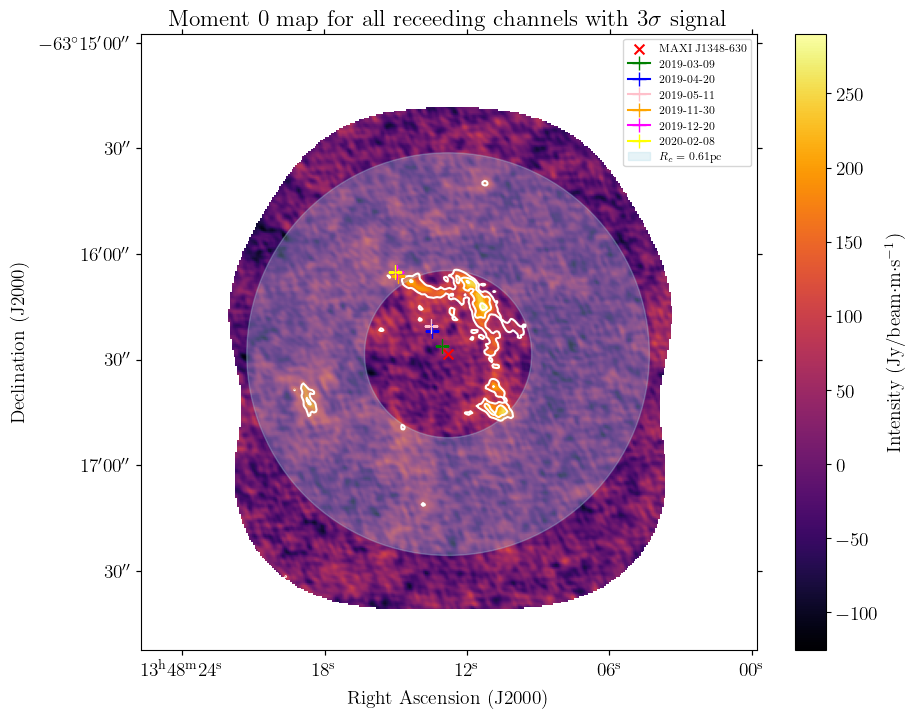

Figure saved as mom_0map_full_features.pdf


In [66]:
# Load the FITS file
file_path = "moment_0_receeding_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Define pixel scale and radius for the circle
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert from degrees to arcseconds
radius_pixels = 23.74 / pixel_scale  # Circle radius in pixels

# Define RA/Dec values for the green "+" signs (in degrees)
ra_dec = {
    "2019-03-09": ("13h48m13.03s", "-63d16m26.26s", 'green'),
    "2019-04-20": ("13h48m13.45s", "-63d16m21.91s", 'blue'),
    "2019-05-11": ("13h48m13.53s", "-63d16m20.47s", 'pink'),
    "2019-11-30": ("13h48m14.90s", "-63d16m06.27s", 'orange'),
    "2019-12-20": ("13h48m14.93s", "-63d16m05.28s", 'magenta'),
    "2020-02-08": ("13h48m15.03s", "-63d16m05.23s", 'yellow'),
}

ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
# Transform coordinates from RA/Dec to pixel coordinates
coords = []
coordsJ1348=[]
for date, (ra, dec, color) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree, color))
    
for name, (ra,dec) in ra_dec_J1348.items():
    sky_coord_J1348 = SkyCoord(ra, dec, frame="icrs")
    coordsJ1348.append((name, sky_coord_J1348.ra.degree, sky_coord_J1348.dec.degree))
    
print(coordsJ1348)
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Main image
im = ax.imshow(data, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all receeding channels with $3\sigma$ signal")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add red cross (Source position)
sourcecoords=wcs.world_to_pixel(SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs"))
plt.scatter(sourcecoords[0],sourcecoords[1], zorder=10, marker='x', color='r', s=50, label=coordsJ1348[0][0])

# Add green "+" signs and labels
for date, ra_deg, dec_deg, color in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.plot(
        pixel_coord[0], pixel_coord[1], 
        marker="+", color=color, 
        markersize=10, label=f"{date}")

    
# Define the radii of the annulus in arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19

# Convert radii to pixels
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

# Create the annulus (donut shape)
annulus = Wedge(
    center=(sourcecoords[0],sourcecoords[1]),         # Centered on the red cross
    r=outer_radius_pixels,          # Outer radius in pixels
    theta1=0,                       # Start angle (degrees)
    theta2=360,                     # End angle (degrees)
    width=outer_radius_pixels - inner_radius_pixels,  # Width of the annulus
    transform=ax.get_transform("pixel"),  # Transform to pixel space
    color="lightblue",              # Light blue fill
    alpha=0.3,label="$R_c=0.61$pc")  # Transparency

# Add the annulus to the plot
ax.add_patch(annulus)

    
plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "mom_0map_full_features.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)

print(f"Figure saved as {output_filename}")

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


[('MAXI J1348-630', 207.05329166666664, -63.27457777777778)]


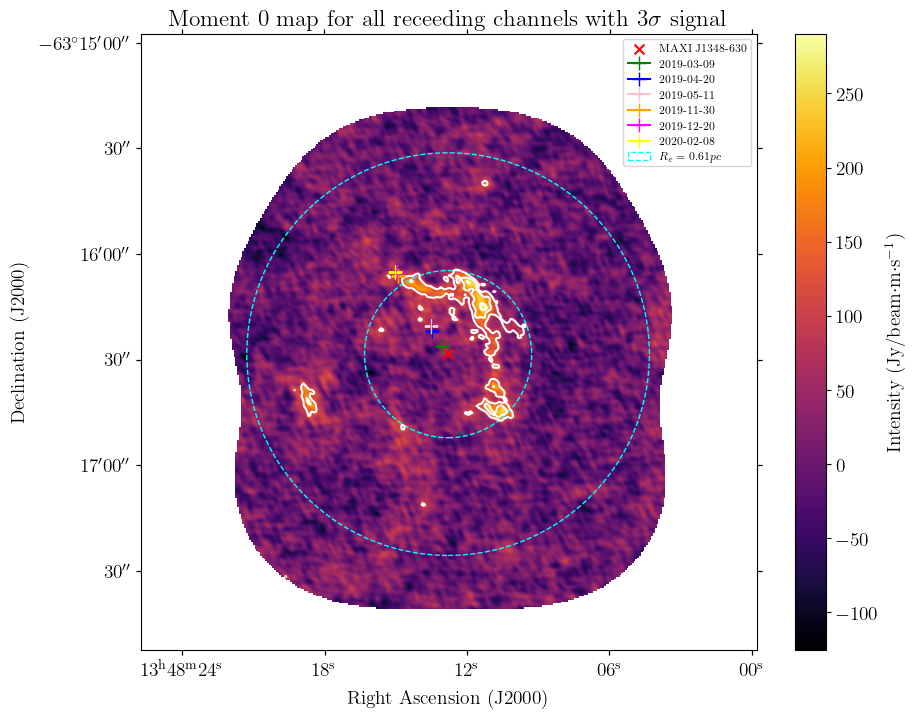

Figure saved as mom_0map_full_features_dashedcircle_positions.pdf


In [74]:
# Load the FITS file
file_path = "moment_0_receeding_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Define pixel scale and radius for the circle
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert from degrees to arcseconds
radius_pixels = 23.74 / pixel_scale  # Circle radius in pixels

# Define RA/Dec values for the green "+" signs (in degrees)
ra_dec = {
    "2019-03-09": ("13h48m13.03s", "-63d16m26.26s", 'green'),
    "2019-04-20": ("13h48m13.45s", "-63d16m21.91s", 'blue'),
    "2019-05-11": ("13h48m13.53s", "-63d16m20.47s", 'pink'),
    "2019-11-30": ("13h48m14.90s", "-63d16m06.27s", 'orange'),
    "2019-12-20": ("13h48m14.93s", "-63d16m05.28s", 'magenta'),
    "2020-02-08": ("13h48m15.03s", "-63d16m05.23s", 'yellow'),
}

ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
# Transform coordinates from RA/Dec to pixel coordinates
coords = []
coordsJ1348=[]
for date, (ra, dec, color) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree, color))
    
for name, (ra,dec) in ra_dec_J1348.items():
    sky_coord_J1348 = SkyCoord(ra, dec, frame="icrs")
    coordsJ1348.append((name, sky_coord_J1348.ra.degree, sky_coord_J1348.dec.degree))
    
print(coordsJ1348)
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Main image
im = ax.imshow(data, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all receeding channels with $3\sigma$ signal")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add red cross (Source position)
sourcecoords=wcs.world_to_pixel(SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs"))
plt.scatter(sourcecoords[0],sourcecoords[1], zorder=10, marker='x', color='r', s=50, label=coordsJ1348[0][0])

# Add green "+" signs and labels
for date, ra_deg, dec_deg, color in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.plot(
        pixel_coord[0], pixel_coord[1], 
        marker="+", color=color, 
        markersize=10, label=f"{date}")

    
# Define the radii of the annulus in arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19

# Convert radii to pixels
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale
"""
# Create the annulus (donut shape)
annulus = Wedge(
    center=(sourcecoords[0],sourcecoords[1]),         # Centered on the red cross
    r=outer_radius_pixels,          # Outer radius in pixels
    theta1=0,                       # Start angle (degrees)
    theta2=360,                     # End angle (degrees)
    width=outer_radius_pixels - inner_radius_pixels,  # Width of the annulus
    transform=ax.get_transform("pixel"),  # Transform to pixel space
    color="lightblue",              # Light blue fill
    alpha=0.3,label="$R_c=0.61$pc")  # Transparency

# Add the annulus to the plot
ax.add_patch(annulus)
"""
circle_in = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=inner_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    lw=1, 
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=outer_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    linestyle='--',
    lw=1)
ax.add_patch(circle_out)
    
plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "mom_0map_full_features_dashedcircle_positions.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)


print(f"Figure saved as {output_filename}")

Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


[('MAXI J1348-630', 207.05329166666664, -63.27457777777778)]


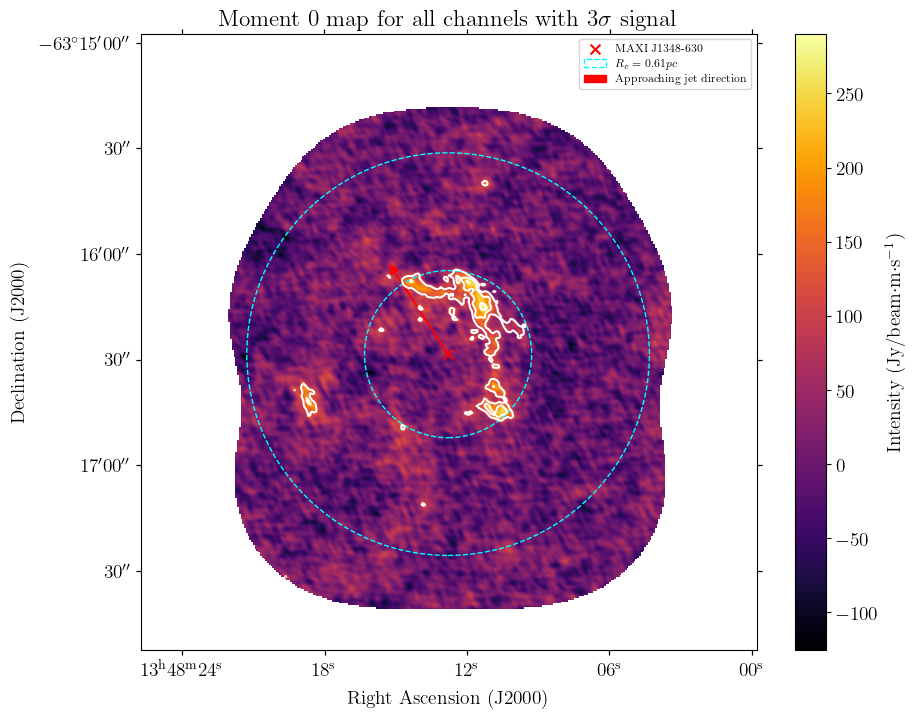

Figure saved as mom_0map_full_features_dashedcircle_arrow.pdf


In [2]:
# Load the FITS file
file_path = "moment_0_receeding_channels.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data
    
    contour_img = fits.open('moment_0_selected_channels.fits')
    contour_data = contour_img[0].data
    
# Load WCS info
wcs = WCS(header)

# Define pixel scale and radius for the circle
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert from degrees to arcseconds
radius_pixels = 23.74 / pixel_scale  # Circle radius in pixels

# Define RA/Dec values for the green "+" signs (in degrees)
ra_dec = {"Approaching jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
# Transform coordinates from RA/Dec to pixel coordinates
coords = []
coordsJ1348=[]
for date, (ra, dec, color) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree, color))
    
for name, (ra,dec) in ra_dec_J1348.items():
    sky_coord_J1348 = SkyCoord(ra, dec, frame="icrs")
    coordsJ1348.append((name, sky_coord_J1348.ra.degree, sky_coord_J1348.dec.degree))
    
print(coordsJ1348)
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Main image
im = ax.imshow(data, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (Jy/beam$\cdot$m$\cdot$s$^{-1}$)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"Moment 0 map for all channels with $3\sigma$ signal")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add red cross (Source position)
sourcecoords=wcs.world_to_pixel(SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs"))
plt.scatter(sourcecoords[0],sourcecoords[1], zorder=10, marker='x', color='r', s=50, label=coordsJ1348[0][0])

    
# Define the radii of the annulus in arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19

# Convert radii to pixels
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

circle_in = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=inner_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    lw=1, 
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=outer_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    linestyle='--',
    lw=1)
ax.add_patch(circle_out)

# Add green "+" signs and labels
for date, ra_deg, dec_deg, color in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
    x=sourcecoords[0], y=sourcecoords[1],           # Starting point (x, y)
    dx=(pixel_coord[0]-sourcecoords[0]), dy=(pixel_coord[1]-sourcecoords[1]),         # Arrow displacement (dx, dy)
    width=0.01,             # Width of the arrow body
    head_width=5,        # Width of the arrow head
    head_length=5,        # Length of the arrow head
    fc=color, ec=color,   # Face color and edge color
    label=f"{date}")

    
plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "mom_0map_full_features_dashedcircle_arrow.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)


print(f"Figure saved as {output_filename}")

<SkyCoord (ICRS): (ra, dec) in deg
    (207.05329167, -63.27457778)>


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


ValueError: Number of world inputs (1) does not match expected (2)

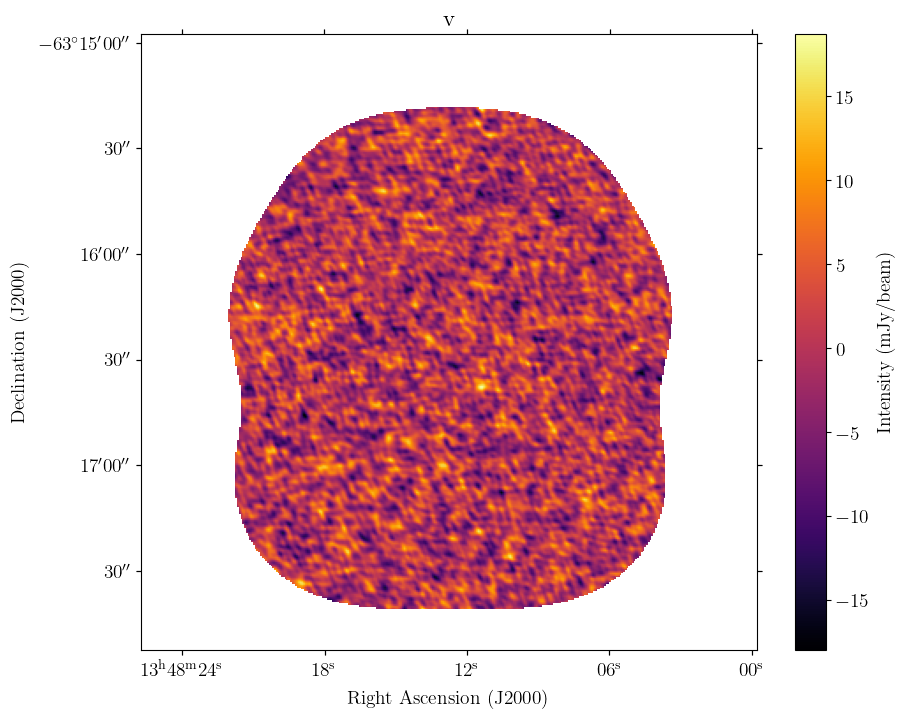

In [6]:
# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Update index if data isn't in the primary HDU
    data = hdul[0].data*1e3
    
    fslice=75
    
    data=data[fslice,:,:]
    contour_img = data
    contour_data = contour_img
    
# Load WCS info
wcs = WCS(header)

# Define pixel scale and radius for the circle
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert from degrees to arcseconds
radius_pixels = 23.74 / pixel_scale  # Circle radius in pixels

# Define RA/Dec values for the green "+" signs (in degrees)
ra_dec = {"Receeding jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
# Transform coordinates from RA/Dec to pixel coordinates
coords = []
coordsJ1348=[]
for date, (ra, dec, color) in ra_dec.items():
    sky_coord = SkyCoord(ra, dec, frame="icrs")
    coords.append((date, sky_coord.ra.degree, sky_coord.dec.degree, color))
    
for name, (ra,dec) in ra_dec_J1348.items():
    sky_coord_J1348 = SkyCoord(ra, dec, frame="icrs")
    coordsJ1348.append((name, sky_coord_J1348.ra.degree, sky_coord_J1348.dec.degree))
    
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs.celestial)

# Main image
im = ax.imshow(data, origin="lower", cmap="inferno")
plt.colorbar(im, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
plt.title(f"v")

# Add contours
plt.contour(contour_data, colors='w', levels=40 * np.array([3, 5, 7]))

# Add red cross (Source position)
coords1=SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs")
print(coords1)
sourcecoords=wcs.world_to_pixel(coords1)
print(sourcecoords)
plt.scatter(sourcecoords[0],sourcecoords[1], zorder=10, marker='x', color='r', s=50, label=coordsJ1348[0][0])

    
# Define the radii of the annulus in arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19

# Convert radii to pixels
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

circle_in = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=inner_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    lw=1, 
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0],sourcecoords[1]), 
    radius=outer_radius_pixels, 
    transform=ax.get_transform('pixel'), 
    edgecolor='cyan', 
    facecolor='none', 
    linestyle='--',
    lw=1)
ax.add_patch(circle_out)

# Add green "+" signs and labels
for date, ra_deg, dec_deg, color in coords:
    # Transform world coordinates to pixel coordinates
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
    x=sourcecoords[0], y=sourcecoords[1],           # Starting point (x, y)
    dx=(pixel_coord[0]-sourcecoords[0]), dy=(pixel_coord[1]-sourcecoords[1]),         # Arrow displacement (dx, dy)
    width=0.01,             # Width of the arrow body
    head_width=5,        # Width of the arrow head
    head_length=5,        # Length of the arrow head
    fc=color, ec=color,   # Face color and edge color
    label=f"{date}")

    
plt.legend(loc="upper right", fontsize=8)
plt.show()

# Save the figure
output_filename = "slicedata.pdf"
fig.savefig(
    output_filename,
    dpi=300,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.1,
    metadata={"Creator": "Matplotlib"},
)


print(f"Figure saved as {output_filename}")

Data shape: (205, 350, 350)


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


GIF saved to J1348_channels65-120.gif


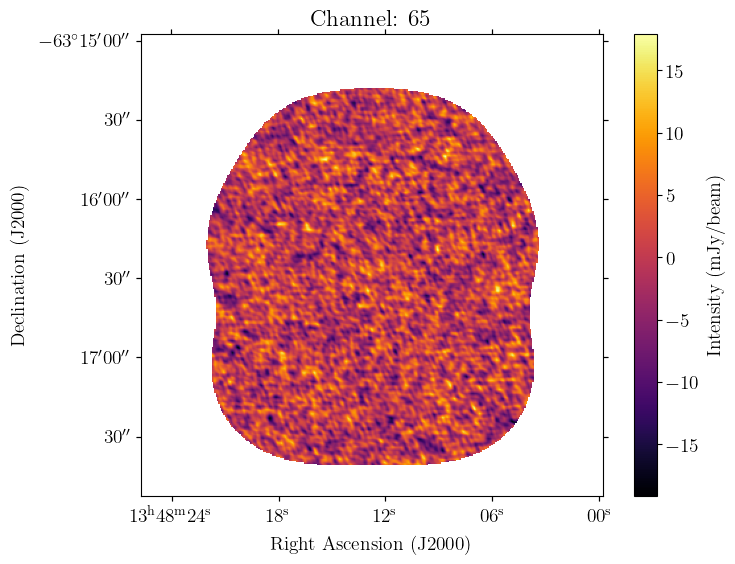

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.animation import FuncAnimation, PillowWriter

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header  # Adjust index if needed
    data = hdul[0].data * 1e3  # Multiply data by 1e3

# Verify data dimensions
print(f"Data shape: {data.shape}")

# Select channels 65 to 120
channels = np.arange(65, 121)
data_subset = data[channels, :, :]  # Assuming data is (channels, RA, Dec)

# Load WCS information
wcs = WCS(header, naxis=2)  # Use only the spatial axes for plotting

# Create a figure for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)
im = ax.imshow(data_subset[0], origin="lower", cmap="inferno")
plt.colorbar(im, ax=ax, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
title = ax.set_title("Channel: 65")

# Update function for animation
def update(frame):
    im.set_data(data_subset[frame - 65])
    title.set_text(f"Channel: {frame}")
    return im, title

# Create the animation
ani = FuncAnimation(
    fig, update, frames=channels, interval=200, blit=False  # 200 ms per frame
)

# Save as GIF
output_path = "J1348_channels65-120.gif"
ani.save(output_path, writer=PillowWriter(fps=5))

print(f"GIF saved to {output_path}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


GIF saved to J1348_channels65-120_full_features.gif


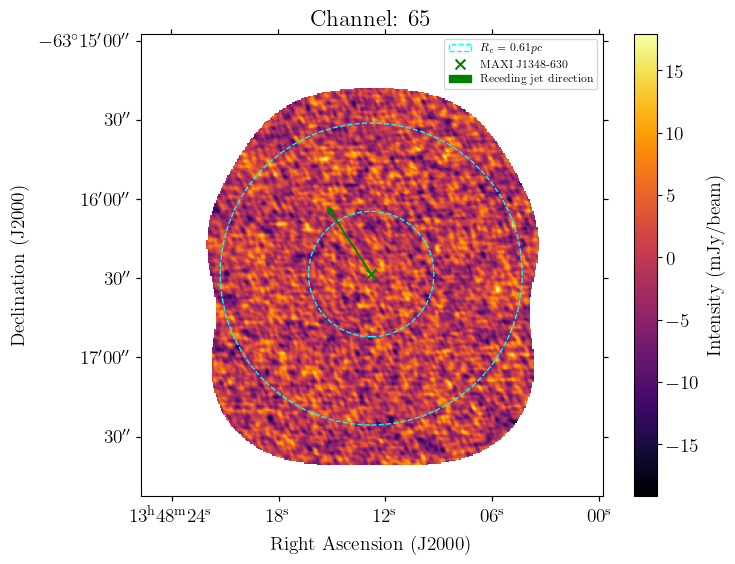

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.animation import FuncAnimation, PillowWriter
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header
    data = hdul[0].data * 1e3  # Multiply data by 1e3

# Select channels 65 to 120
channels = np.arange(65, 121)
data_subset = data[channels, :, :]  # Assuming data is (channels, RA, Dec)

# Load WCS info
wcs = WCS(header, naxis=2)

# Define pixel scale and radii
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert degrees to arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

# Define source and direction
ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
ra_dec = {"Receding jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

coordsJ1348 = [
    (
        name,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
    )
    for name, (ra, dec) in ra_dec_J1348.items()
]

coords = [
    (
        date,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
        color,
    )
    for date, (ra, dec, color) in ra_dec.items()
]

# Compute source pixel coordinates
source_skycoord = SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs")
sourcecoords = wcs.world_to_pixel(source_skycoord)

# Create a figure for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)
im = ax.imshow(data_subset[0], origin="lower", cmap="inferno")
plt.colorbar(im, ax=ax, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
title = ax.set_title("Channel: 65")

# Add circles
circle_in = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=inner_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=outer_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--'
)
ax.add_patch(circle_out)

# Add red cross
ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
)

# Add arrows
for date, ra_deg, dec_deg, color in coords:
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
        sourcecoords[0],
        sourcecoords[1],
        dx=(pixel_coord[0] - sourcecoords[0]),
        dy=(pixel_coord[1] - sourcecoords[1]),
        width=0.01,
        head_width=5,
        head_length=5,
        fc='green',
        ec='green',
        label=date
    )
plt.legend(loc="upper right", fontsize=8)


# Animation update function
def update(frame):
    im.set_data(data_subset[frame - 65])
    title.set_text(f"Channel: {frame}")
    return im, title

# Create animation
ani = FuncAnimation(
    fig, update, frames=channels, interval=200, blit=False
)

# Save as GIF
output_path = "J1348_channels65-120_full_features.gif"
ani.save(output_path, writer=PillowWriter(fps=5))

print(f"GIF saved to {output_path}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


GIF saved to J1348_channels65-120_with_beam_and_contours.gif


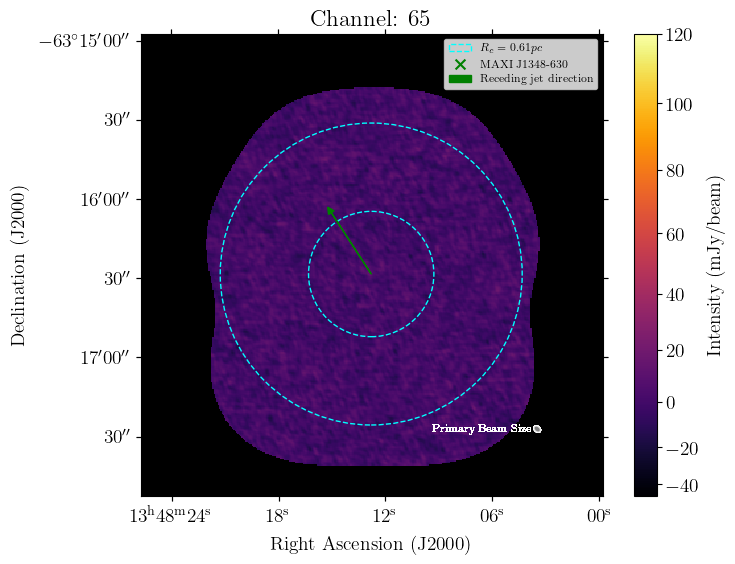

In [19]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Ellipse
from matplotlib.animation import FuncAnimation, PillowWriter
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy.wcs.utils import skycoord_to_pixel
from matplotlib import colors

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header
    data = hdul[0].data * 1e3  # Multiply data by 1e3

# Select channels 65 to 120
channels = np.arange(65, 121)
data_subset = data[channels, :, :]  # Assuming data is (channels, RA, Dec)

# Load WCS info
wcs = WCS(header, naxis=2)

# Define pixel scale and radii
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert degrees to arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

# Define source and direction
ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
ra_dec = {"Receding jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

coordsJ1348 = [
    (
        name,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
    )
    for name, (ra, dec) in ra_dec_J1348.items()
]

coords = [
    (
        date,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
        color,
    )
    for date, (ra, dec, color) in ra_dec.items()
]

# Compute source pixel coordinates
source_skycoord = SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs")
sourcecoords = wcs.world_to_pixel(source_skycoord)

# Beam parameters
beam_bmin_pix = header['BMIN'] / abs(wcs.wcs.cdelt[1])  # Minor axis in pixels
beam_bmaj_pix = header['BMAJ'] / abs(wcs.wcs.cdelt[0])  # Major axis in pixels
beam_bpa_deg = header['BPA']  # Position angle in degrees
beam_x_pos = data.shape[2] - 50  # Slight offset from the right edge
beam_y_pos = 50  # Slight offset from the bottom edge

# Create a figure for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)

# Colormap setup
cmap = plt.get_cmap('inferno')
cmap.set_bad('black')
cmap_norm = colors.PowerNorm(1.5, vmin=-50, vmax=120.0)

im = ax.imshow(data_subset[0], cmap=cmap, norm=cmap_norm, aspect='equal', origin='lower', interpolation='none')
plt.colorbar(im, ax=ax, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")
title = ax.set_title("Channel: 65")

# Add circles
circle_in = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=inner_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=outer_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--'
)
ax.add_patch(circle_out)

# Add red cross
ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
)

# Add arrows
for date, ra_deg, dec_deg, color in coords:
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
        sourcecoords[0],
        sourcecoords[1],
        dx=(pixel_coord[0] - sourcecoords[0]),
        dy=(pixel_coord[1] - sourcecoords[1]),
        width=0.01,
        head_width=5,
        head_length=5,
        fc='green',
        ec='green',
        label=date
    )
plt.legend(loc="upper right", fontsize=8)

# Animation update function with contours and beam ellipse
contour_levels = 36.809 * np.array([2, 3, 4])  # Same levels as requested

def update(frame):
    im.set_data(data_subset[frame - 65])
    title.set_text(f"Channel: {frame}")
    
    # Remove previous contours
    for coll in ax.collections:
        coll.remove()
    
    # Add contours
    ax.contour(data_subset[frame - 65], colors='w', levels=contour_levels, transform=ax.get_transform('pixel'))
    
    # Add beam ellipse
    beam_ellipse = Ellipse(
        xy=(beam_x_pos, beam_y_pos),
        width=beam_bmin_pix,
        height=beam_bmaj_pix,
        angle=beam_bpa_deg,
        edgecolor='white',
        facecolor='gray',
        alpha=0.5,
        linewidth=1.0,
        zorder=10
    )
    ax.add_patch(beam_ellipse)
    ax.text(
        beam_x_pos - 80,
        beam_y_pos,
        "Primary Beam Size",
        color="white",
        fontsize=8,
        ha="left",
        va="center",
        zorder=11
    )
    return im, title

# Create animation
ani = FuncAnimation(
    fig, update, frames=channels, interval=200, blit=False
)

# Save as GIF
output_path = "J1348_channels65-120_with_beam_and_contours.gif"
ani.save(output_path, writer=PillowWriter(fps=5))

print(f"GIF saved to {output_path}")


Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


GIF saved to J1348_channel30-120_with_beam_contours_dynamic_cmap.gif


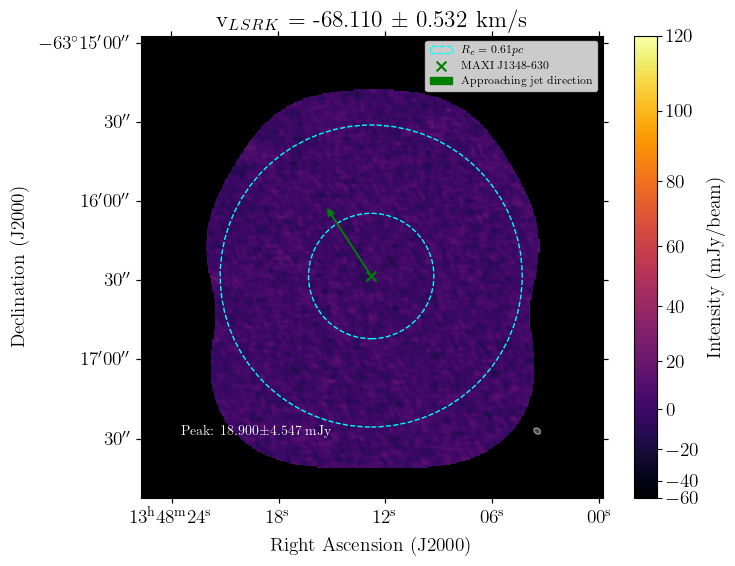

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Ellipse
from matplotlib.animation import FuncAnimation, PillowWriter
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from matplotlib import colors

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header
    data = hdul[0].data * 1e3  # Multiply data by 1e3

# Select channels 30 to 120
channels = np.arange(30, 65)
data_subset = data[channels, :, :]  # Assuming data is (channels, RA, Dec)

# Load WCS info
wcs = WCS(header, naxis=2)

# Define pixel scale and radii
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert degrees to arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

# Define source and direction
ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
ra_dec = {"Approaching jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

coordsJ1348 = [
    (
        name,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
    )
    for name, (ra, dec) in ra_dec_J1348.items()
]

coords = [
    (
        date,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
        color,
    )
    for date, (ra, dec, color) in ra_dec.items()
]

# Compute source pixel coordinates
source_skycoord = SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs")
sourcecoords = wcs.world_to_pixel(source_skycoord)

# Beam parameters
beam_bmin_pix = header['BMIN'] / abs(wcs.wcs.cdelt[1])  # Minor axis in pixels
beam_bmaj_pix = header['BMAJ'] / abs(wcs.wcs.cdelt[0])  # Major axis in pixels
beam_bpa_deg = header['BPA']  # Position angle in degrees
beam_x_pos = data.shape[2] - 50  # Slight offset from the right edge
beam_y_pos = 50  # Slight offset from the bottom edge

# Calculate sigma levels for contours
noise_level = np.std(data_subset)  # Standard deviation as noise level
contour_levels = noise_level * np.array([3, 4, 5])  # Contours at 3, 4, 5 sigma

# Dynamically set color map limits
data_max = np.max(data_subset)
cmap = plt.get_cmap('inferno')
cmap.set_bad('black')
cmap_norm = colors.PowerNorm(1.5, vmin=-60, vmax=120)  # Peak value normalization

# Create a figure for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)

im = ax.imshow(data_subset[0], cmap=cmap, norm=cmap_norm, aspect='equal', origin='lower', interpolation='none')
plt.colorbar(im, ax=ax, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")

# Add circles
circle_in = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=inner_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=outer_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--'
)
ax.add_patch(circle_out)

# Add red cross
ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
)

# Add arrows
for date, ra_deg, dec_deg, color in coords:
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
        sourcecoords[0],
        sourcecoords[1],
        dx=(pixel_coord[0] - sourcecoords[0]),
        dy=(pixel_coord[1] - sourcecoords[1]),
        width=0.01,
        head_width=5,
        head_length=5,
        fc='green',
        ec='green',
        label=date
    )
plt.legend(loc="upper right", fontsize=8)

# Create a dictionary to store references to the beam and text
annotations = {"beam": None, "peak_text": None, "rms_text": None}

contour_levels = 20 * np.array([2, 3, 4]) 

# Animation update function
def update(frame):
    im.set_data(data_subset[frame - 30])
    v_text = f"v$_L$$_S$$_R$$_K$  = {frame*1.063-100:.3f} ± {0.532} km/s"
    title.set_text(v_text)
    
    # Remove previous contours
    for coll in ax.collections:
        coll.remove()
    
    # Add contours
    ax.contour(data_subset[frame - 30], colors='w', linewidths=1, levels=contour_levels, transform=ax.get_transform('pixel'))
    
    ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
    )
    
    # Remove previous annotations
    if annotations["beam"] is not None:
        annotations["beam"].remove()
    if annotations["peak_text"] is not None:
        annotations["peak_text"].remove()
    if annotations["rms_text"] is not None:
        annotations["rms_text"].remove()
    
    # Add beam ellipse
    beam_ellipse = Ellipse(
        xy=(beam_x_pos, beam_y_pos),
        width=beam_bmin_pix,
        height=beam_bmaj_pix,
        angle=beam_bpa_deg,
        edgecolor='white',
        facecolor='gray',
        alpha=0.5,
        linewidth=1.0,
        zorder=10
    )
    ax.add_patch(beam_ellipse)
    annotations["beam"] = beam_ellipse  # Save reference
    
    # Add peak and RMS text
    array_max = np.nanmax(data_subset[frame - 30])  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(data_subset[frame - 30]**2))  # Calculate the RMS, ignoring NaNs
    
    # Format the text to display maximum value and RMS
    max_text = f"Peak: {array_max:.3f}±{rms:.3f} mJy"
    rms_text = f""
    peak_annotation = ax.text(beam_x_pos - 270, beam_y_pos-3, max_text, fontsize=10, color='white', zorder=11)
    rms_annotation = ax.text(beam_x_pos - 93, beam_y_pos-3, rms_text, fontsize=10, color='white', zorder=11)
    annotations["peak_text"] = peak_annotation  # Save reference
    annotations["rms_text"] = rms_annotation  # Save reference
    
    return im, title

# Create animation
title = ax.set_title("Channel: 30")
ani = FuncAnimation(
    fig, update, frames=channels, interval=200, blit=False
)

# Save as GIF
output_path = "J1348_channel30-120_with_beam_contours_dynamic_cmap.gif"
ani.save(output_path, writer=PillowWriter(fps=2))

print(f"GIF saved to {output_path}")



Set OBSGEO-B to   -23.022886 from OBSGEO-[XYZ].
Set OBSGEO-H to     5053.796 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


GIF saved to J1348_channel30-120_with_beam_contours_dynamic_cmap_noarrow.gif


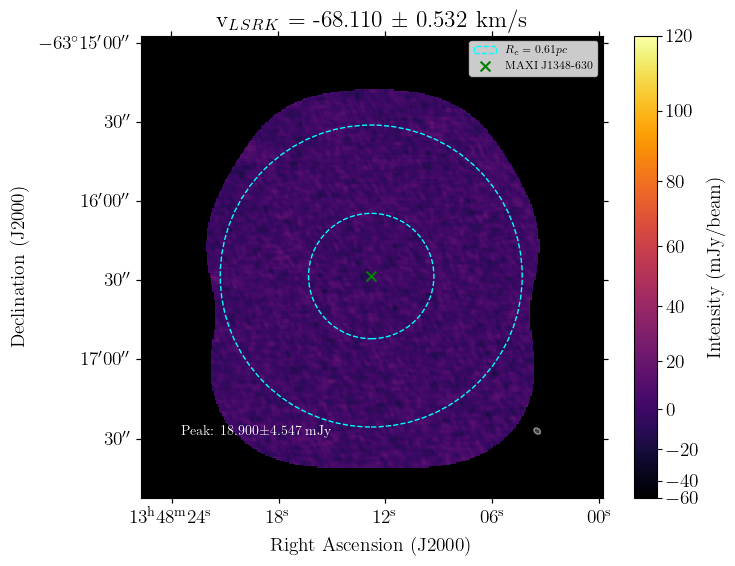

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Ellipse
from matplotlib.animation import FuncAnimation, PillowWriter
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from matplotlib import colors

# Load the FITS file
file_path = "J1348_line3.fits"
with fits.open(file_path) as hdul:
    header = hdul[0].header
    data = hdul[0].data * 1e3  # Multiply data by 1e3

# Select channels 30 to 120
channels = np.arange(30, 65)
data_subset = data[channels, :, :]  # Assuming data is (channels, RA, Dec)

# Load WCS info
wcs = WCS(header, naxis=2)

# Define pixel scale and radii
pixel_scale = np.abs(header['CDELT1']) * 3600  # Convert degrees to arcseconds
inner_radius_arcsec = 23.74
outer_radius_arcsec = 57.19
inner_radius_pixels = inner_radius_arcsec / pixel_scale
outer_radius_pixels = outer_radius_arcsec / pixel_scale

# Define source and direction
ra_dec_J1348 = {'MAXI J1348-630': ('13h48m12.79s', '-63d16m28.48s')}
ra_dec = {"Approaching jet direction": ("13h48m15.03s", "-63d16m05.23s", 'red')}

coordsJ1348 = [
    (
        name,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
    )
    for name, (ra, dec) in ra_dec_J1348.items()
]

coords = [
    (
        date,
        SkyCoord(ra, dec, frame="icrs").ra.degree,
        SkyCoord(ra, dec, frame="icrs").dec.degree,
        color,
    )
    for date, (ra, dec, color) in ra_dec.items()
]

# Compute source pixel coordinates
source_skycoord = SkyCoord(coordsJ1348[0][1], coordsJ1348[0][2], unit="deg", frame="icrs")
sourcecoords = wcs.world_to_pixel(source_skycoord)

# Beam parameters
beam_bmin_pix = header['BMIN'] / abs(wcs.wcs.cdelt[1])  # Minor axis in pixels
beam_bmaj_pix = header['BMAJ'] / abs(wcs.wcs.cdelt[0])  # Major axis in pixels
beam_bpa_deg = header['BPA']  # Position angle in degrees
beam_x_pos = data.shape[2] - 50  # Slight offset from the right edge
beam_y_pos = 50  # Slight offset from the bottom edge

# Calculate sigma levels for contours
noise_level = np.std(data_subset)  # Standard deviation as noise level
contour_levels = noise_level * np.array([3, 4, 5])  # Contours at 3, 4, 5 sigma

# Dynamically set color map limits
data_max = np.max(data_subset)
cmap = plt.get_cmap('inferno')
cmap.set_bad('black')
cmap_norm = colors.PowerNorm(1.5, vmin=-60, vmax=120)  # Peak value normalization

# Create a figure for animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)

im = ax.imshow(data_subset[0], cmap=cmap, norm=cmap_norm, aspect='equal', origin='lower', interpolation='none')
plt.colorbar(im, ax=ax, label="Intensity (mJy/beam)")
ax.set_xlabel("Right Ascension (J2000)")
ax.set_ylabel("Declination (J2000)")

# Add circles
circle_in = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=inner_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--',
    label="$R_c=0.61pc$"
)
ax.add_patch(circle_in)

circle_out = Circle(
    (sourcecoords[0], sourcecoords[1]),
    radius=outer_radius_pixels,
    transform=ax.get_transform('pixel'),
    edgecolor='cyan',
    facecolor='none',
    lw=1,
    linestyle='--'
)
ax.add_patch(circle_out)

# Add red cross
ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
)
'''
# Add arrows
for date, ra_deg, dec_deg, color in coords:
    pixel_coord = wcs.world_to_pixel(SkyCoord(ra_deg, dec_deg, unit="deg", frame="icrs"))
    ax.arrow(
        sourcecoords[0],
        sourcecoords[1],
        dx=(pixel_coord[0] - sourcecoords[0]),
        dy=(pixel_coord[1] - sourcecoords[1]),
        width=0.01,
        head_width=5,
        head_length=5,
        fc='green',
        ec='green',
        label=date
    )
'''
plt.legend(loc="upper right", fontsize=8)

# Create a dictionary to store references to the beam and text
annotations = {"beam": None, "peak_text": None, "rms_text": None}

contour_levels = 20 * np.array([2, 3, 4]) 

# Animation update function
def update(frame):
    im.set_data(data_subset[frame - 30])
    v_text = f"v$_L$$_S$$_R$$_K$ = {frame*1.063-100:.3f} ± {0.532} km/s"
    title.set_text(v_text)
    
    # Remove previous contours
    for coll in ax.collections:
        coll.remove()
    
    # Add contours
    ax.contour(data_subset[frame - 30], colors='w', linewidths=1, levels=contour_levels, transform=ax.get_transform('pixel'))
    
    ax.scatter(
    sourcecoords[0],
    sourcecoords[1],
    zorder=10,
    marker='x',
    color='green',
    s=50,
    label="MAXI J1348-630"
    )
    
    # Remove previous annotations
    if annotations["beam"] is not None:
        annotations["beam"].remove()
    if annotations["peak_text"] is not None:
        annotations["peak_text"].remove()
    if annotations["rms_text"] is not None:
        annotations["rms_text"].remove()
    
    # Add beam ellipse
    beam_ellipse = Ellipse(
        xy=(beam_x_pos, beam_y_pos),
        width=beam_bmin_pix,
        height=beam_bmaj_pix,
        angle=beam_bpa_deg,
        edgecolor='white',
        facecolor='gray',
        alpha=0.5,
        linewidth=1.0,
        zorder=10
    )
    ax.add_patch(beam_ellipse)
    annotations["beam"] = beam_ellipse  # Save reference
    
    # Add peak and RMS text
    array_max = np.nanmax(data_subset[frame - 30])  # Find the maximum value, ignoring NaNs
    rms = np.sqrt(np.nanmean(data_subset[frame - 30]**2))  # Calculate the RMS, ignoring NaNs
    
    # Format the text to display maximum value and RMS
    max_text = f"Peak: {array_max:.3f}±{rms:.3f} mJy"
    rms_text = f""
    peak_annotation = ax.text(beam_x_pos - 270, beam_y_pos-3, max_text, fontsize=10, color='white', zorder=11)
    rms_annotation = ax.text(beam_x_pos - 93, beam_y_pos-3, rms_text, fontsize=10, color='white', zorder=11)
    annotations["peak_text"] = peak_annotation  # Save reference
    annotations["rms_text"] = rms_annotation  # Save reference
    
    return im, title

# Create animation
title = ax.set_title("Channel: 30")
ani = FuncAnimation(
    fig, update, frames=channels, interval=200, blit=False
)

# Save as GIF
output_path = "J1348_channel30-120_with_beam_contours_dynamic_cmap_noarrow.gif"
ani.save(output_path, writer=PillowWriter(fps=2))

print(f"GIF saved to {output_path}")